In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# Create a shorcut of the Images folder from the shared folder to your own drive
img_folder_path= "/content/gdrive/MyDrive/IMT/ProCom/Images"

In [ ]:
coro_imgs_list = os.listdir(f'{img_folder_path}/Coronary_Angiography/')
dia_imgs_list = os.listdir(f'{img_folder_path}/Dilated_Fundus/')

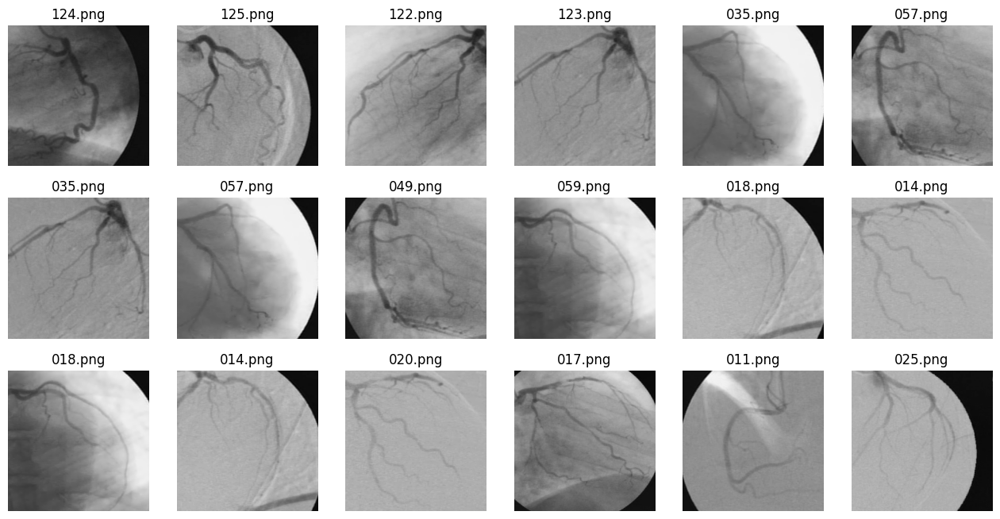

In [ ]:
fig, ax= plt.subplots(3,6, figsize=(16,8))
for i in range(3):
    for j in range(6):
        ax[i,j].imshow(plt.imread(f'{img_folder_path}/Coronary_Angiography/{coro_imgs_list[i*3+j]}'))
        ax[i,j].set_title(coro_imgs_list[i*4+j][-7:])
        ax[i,j].axis('off')

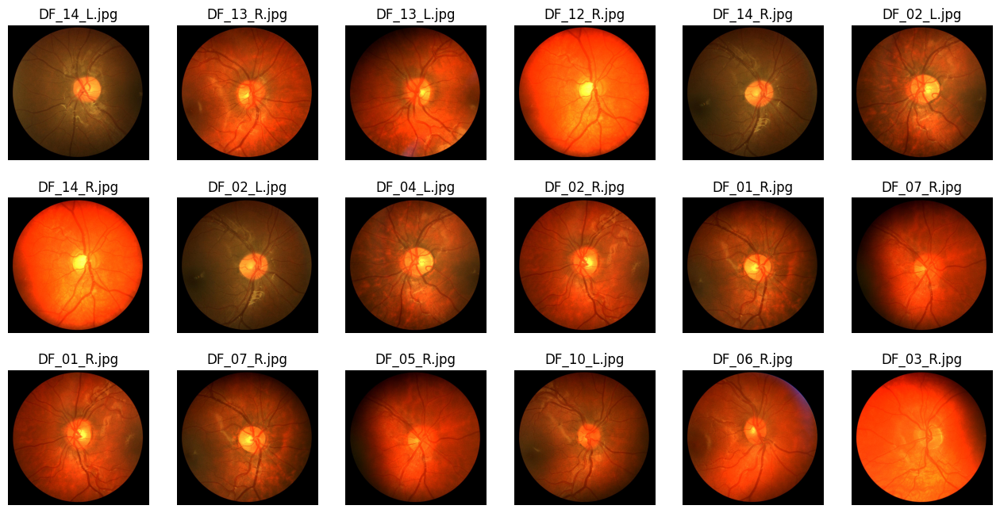

In [ ]:
fig, ax= plt.subplots(3,6, figsize=(16,8))
for i in range(3):
    for j in range(6):
        ax[i,j].imshow(plt.imread(f'{img_folder_path}/Dilated_Fundus/{dia_imgs_list[i*3+j]}'))
        ax[i,j].set_title(dia_imgs_list[i*4+j])
        ax[i,j].axis('off')

##Denoising using a classical approach NLM: Non-Local Means


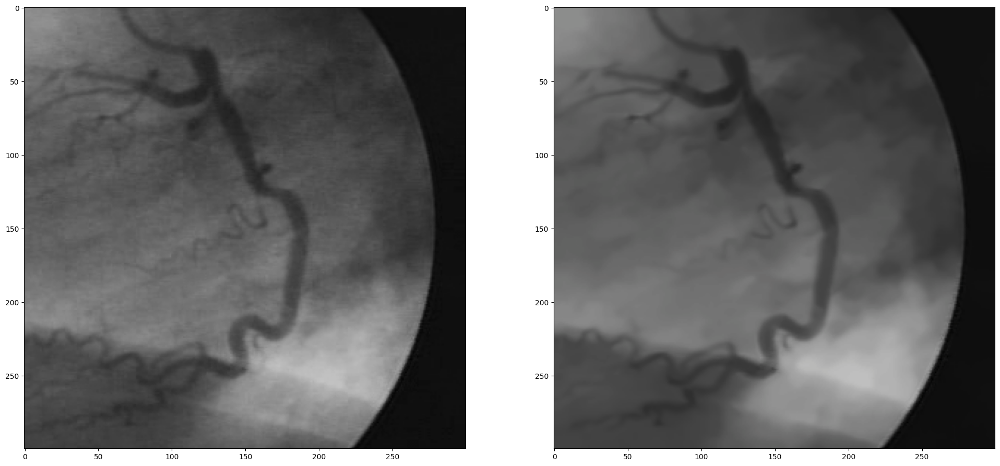

In [ ]:
noisy_image = cv2.imread(f'{img_folder_path}/Coronary_Angiography/{coro_imgs_list[0]}', cv2.IMREAD_COLOR)
denoised_image = cv2.fastNlMeansDenoisingColored(noisy_image)

fig, ax= plt.subplots(1,2, figsize=(24,12))
ax[0].imshow(cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB))
ax[1].imshow(cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB))

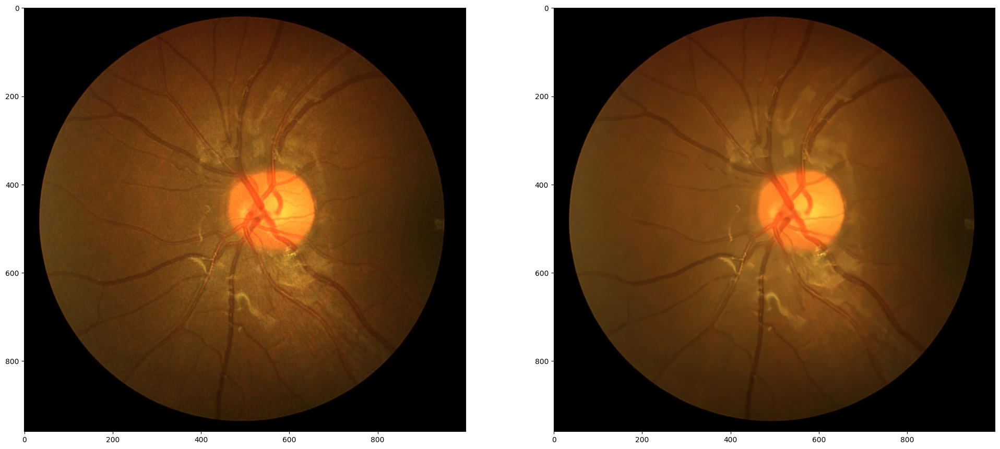

In [ ]:
noisy_image = cv2.imread(f'{img_folder_path}/Dilated_Fundus/{dia_imgs_list[0]}', cv2.IMREAD_COLOR)
denoised_image = cv2.fastNlMeansDenoisingColored(noisy_image)

fig, ax= plt.subplots(1,2, figsize=(24,12))
ax[0].imshow(cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB))
ax[1].imshow(cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB))

## Segmentation using some Pretrained models

In [ ]:
!pip install segmentation_models

In [ ]:
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [ ]:
import segmentation_models as sm
import tensorflow as tf

BACKBONE = 'inceptionv3'
preprocess_input = sm.get_preprocessing(BACKBONE)

#img_path= f'{img_folder_path}/Coronary_Angiography/{coro_imgs_list[0]}'
img_path = f'{img_folder_path}/Dilated_Fundus/{dia_imgs_list[0]}'
img = tf.keras.preprocessing.image.load_img(img_path, target_size=(256, 256))
img = tf.keras.preprocessing.image.img_to_array(img).astype(np.uint8)
img = preprocess_input(np.expand_dims(img, axis=0))

model = sm.Unet(BACKBONE, encoder_weights='imagenet', activation='sigmoid')

# Compile the model with an appropriate loss and metrics for segmentation
model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

# Perform segmentation
segmentation = model.predict(img)

1/1 [==============================] - 2s 2s/step


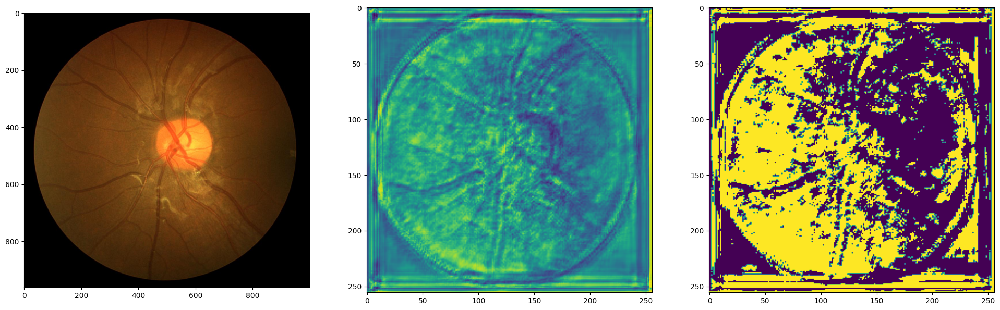

In [ ]:
img_array = plt.imread(img_path)[:,:,:3]

fig, ax= plt.subplots(1,3, figsize=(24,8))
ax[0].imshow(img_array)
ax[1].imshow(segmentation[0])
ax[2].imshow(segmentation[0].round())

## Transfer Learning with the DataSet_etiquete

In [ ]:
train_imgs_path= "/content/gdrive/MyDrive/IMT/ProCom/Images/DataSet_etiquete/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Original"
train_imgs_gt_path= "/content/gdrive/MyDrive/IMT/ProCom/Images/DataSet_etiquete/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/train/Ground truth"

train_imgs_list= os.listdir(train_imgs_path)
train_imgs_gt_list= os.listdir(train_imgs_gt_path)

train_imgs_list.sort()
train_imgs_gt_list.sort()

train_df= pd.DataFrame({'img': train_imgs_list, 'gt': train_imgs_gt_list})

train_df['img_fp']= train_imgs_path+'/'+train_df['img']
train_df['gt_fp']= train_imgs_gt_path+'/'+train_df['gt']

In [ ]:
from sklearn.model_selection import train_test_split
train_df, test_df= train_test_split(train_df, test_size=0.2, shuffle= True, random_state= 43)
train_index= train_df.index.values
val_index= test_df.index.values
train_df= train_df.reset_index(drop=True)
test_df= test_df.reset_index(drop=True)

In [ ]:
test_imgs_path= "/content/gdrive/MyDrive/IMT/ProCom/Images/DataSet_etiquete/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/test/Original"
test_imgs_gt_path= "/content/gdrive/MyDrive/IMT/ProCom/Images/DataSet_etiquete/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation/test/Ground truth"

test_imgs_list= os.listdir(test_imgs_path)
test_imgs_gt_list= os.listdir(test_imgs_gt_path)

test_imgs_list.sort()
test_imgs_gt_list.sort()

test_df= pd.DataFrame({'img': test_imgs_list, 'gt': test_imgs_gt_list})

test_df['img_fp']= test_imgs_path+'/'+test_df['img']
test_df['gt_fp']= test_imgs_gt_path+'/'+test_df['gt']

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
import cv2

class CustomDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, dataframe, batch_size=32, shuffle=True, augment=False, resolution= 256, img_dir= None, tg_dir= None, preprocessing=None, denoising=None):
        self.datagen = ImageDataGenerator(
            rescale=1./255,)
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.dataframe = dataframe
        self.augment = augment
        self.resolution= resolution
        self.img_gen = self.datagen.flow_from_dataframe(
            dataframe= dataframe,
            directory= img_dir,
            x_col= 'img',
            seed= 42,
            class_mode= None,
            batch_size= batch_size,
            shuffle= False,
            target_size= (resolution, resolution),
            color_mode= 'rgb')
        self.tg_gen = self.datagen.flow_from_dataframe(
            dataframe= dataframe,
            directory= tg_dir,
            x_col= 'gt',
            seed= 42,
            class_mode= None,
            batch_size= batch_size,
            shuffle= False,
            target_size= (resolution, resolution),
            color_mode= 'grayscale')
        self.preprocessing = preprocessing
        self.denoising = denoising

    def __len__(self):
        #return len(self.generator)
        #return (len(self.dataframe)-1) // self.batch_size
        return int(np.ceil(self.img_gen.samples / self.batch_size))

    def on_epoch_end(self):
        #self.generator.on_epoch_end()
        self.dataframe = self.dataframe.sample(frac=1).reset_index(drop=True)

    def __getitem__(self, index):
        #return self.generator[idx]
        if self.denoising:
          X= []
          y= []
          for ba in range(self.batch_size):
              img_name=  self.dataframe['img_fp'][self.batch_size * index + ba]
              noisy_image = cv2.imread(img_name, cv2.IMREAD_COLOR)
              noisy_image= cv2.resize(noisy_image, (self.resolution, self.resolution))
              denoised_image = cv2.fastNlMeansDenoisingColored(noisy_image)
              denoised_image= cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB)
              #denoised_image= cv2.resize(denoised_image, (self.resolution, self.resolution))
              X.append(denoised_image)

              tg_name= self.dataframe['gt_fp'][self.batch_size * index + ba]
              tg= plt.imread(tg_name)
              tg= cv2.resize(tg, (self.resolution, self.resolution))
              tg= cv2.cvtColor(tg, cv2.COLOR_RGB2GRAY).round()
              y.append(tg)


          X= np.array(X, dtype=np.float32)
          X= np.divide(X, 255.)
          y= np.array(y, dtype=np.float32)
          y= y.reshape((self.batch_size, self.resolution, self.resolution, 1))

        else:
          X = self.img_gen[index]
          y = self.tg_gen[index]

        if self.preprocessing:
            sample = self.preprocessing(image=X, mask=y)
            X, y = sample['image'], sample['mask']


        return X, y

In [ ]:
import albumentations as A

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform

    Args:!

        preprocessing_fn (callbale): data normalization function
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose

    """

    _transform = [
        A.Lambda(image=preprocessing_fn),
    ]
    return A.Compose(_transform)

In [ ]:
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [ ]:
batch_size= 8
BACKBONE = 'resnet34'
preprocess_input = sm.get_preprocessing(BACKBONE)

custom_gen_train= CustomDataGenerator(train_df, batch_size= batch_size, resolution=128, img_dir= train_imgs_path, tg_dir= train_imgs_gt_path, preprocessing=None, denoising= True)
custom_gen_test= CustomDataGenerator(test_df, batch_size= batch_size, resolution=128, img_dir= test_imgs_path, tg_dir= test_imgs_gt_path, preprocessing=None, denoising=True)

Found 600 validated image filenames.
Found 600 validated image filenames.
Found 200 validated image filenames.
Found 200 validated image filenames.


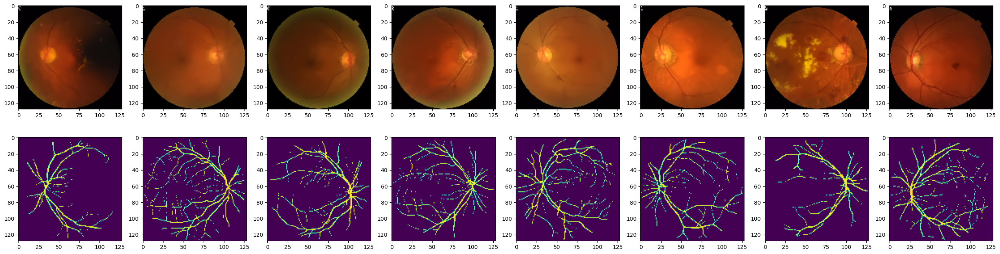

In [ ]:
# Denoised
sample_img, sample_tg= custom_gen_train.__getitem__(10)

fig, ax= plt.subplots(2, batch_size, figsize=(batch_size*4, 8))
for i in range(batch_size):
    ax[0,i].imshow(sample_img[i])
    ax[1,i].imshow(sample_tg[i])

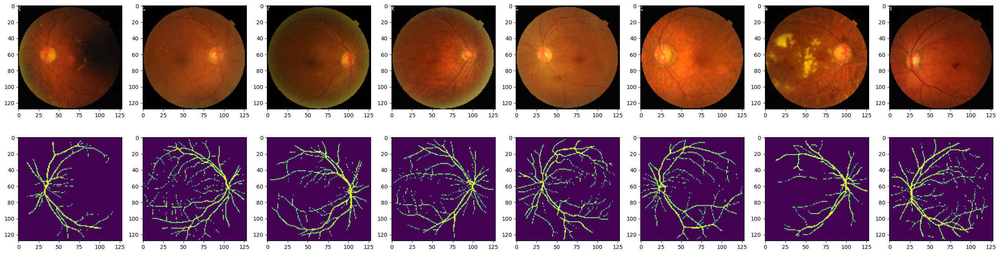

In [ ]:
# Nothing
sample_img, sample_tg= custom_gen_train.__getitem__(10)

fig, ax= plt.subplots(2, batch_size, figsize=(batch_size*4, 8))
for i in range(batch_size):
    ax[0,i].imshow(sample_img[i])
    ax[1,i].imshow(sample_tg[i])

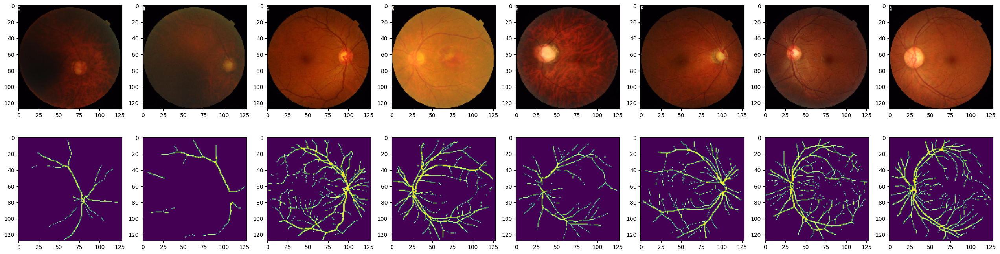

In [ ]:
sample_img, sample_tg= custom_gen_test.__getitem__(5)

fig, ax= plt.subplots(2, batch_size, figsize=(batch_size*4, 8))
for i in range(batch_size):
    ax[0,i].imshow(sample_img[i])
    ax[1,i].imshow(sample_tg[i])

In [ ]:
# Denoised
import segmentation_models as sm
import tensorflow as tf

BACKBONE = 'efficientnetb3'
preprocess_input = sm.get_preprocessing(BACKBONE)

# define model
#model = sm.Unet(BACKBONE, classes=1, encoder_weights='imagenet',  activation='sigmoid')
model = sm.Unet(BACKBONE, classes=1,  activation='sigmoid')

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
#dice_loss = sm.losses.DiceLoss()
#focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
#total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss

metrics = [sm.metrics.IOUScore(), sm.metrics.FScore()]

# compile keras model with defined optimozer, loss and metrics
model.compile('Adam', total_loss, metrics)


#model.compile('Adam', loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])


history = model.fit(custom_gen_train,
                    validation_data= custom_gen_test,
                    epochs=15,
                    validation_steps= len(custom_gen_test),
                    steps_per_epoch= len(custom_gen_train))

Epoch 1/15
75/75 [==============================] - 295s 3s/step - loss: 0.8449 - iou_score: 0.1310 - f1-score: 0.2275 - val_loss: 1.1104 - val_iou_score: 0.0966 - val_f1-score: 0.1758
Epoch 2/15
75/75 [==============================] - 230s 3s/step - loss: 0.5142 - iou_score: 0.3542 - f1-score: 0.5200 - val_loss: 0.6951 - val_iou_score: 0.2268 - val_f1-score: 0.3695
Epoch 3/15
75/75 [==============================] - 229s 3s/step - loss: 0.4175 - iou_score: 0.4528 - f1-score: 0.6227 - val_loss: 0.5464 - val_iou_score: 0.3358 - val_f1-score: 0.5021
Epoch 4/15
75/75 [==============================] - 254s 3s/step - loss: 0.3868 - iou_score: 0.4880 - f1-score: 0.6554 - val_loss: 0.4663 - val_iou_score: 0.4088 - val_f1-score: 0.5796
Epoch 5/15
75/75 [==============================] - 228s 3s/step - loss: 0.3701 - iou_score: 0.5076 - f1-score: 0.6729 - val_loss: 0.4284 - val_iou_score: 0.4448 - val_f1-score: 0.6151
Epoch 6/15
75/75 [==============================] - 251s 3s/step - loss: 0.

1/1 [==============================] - 2s 2s/step


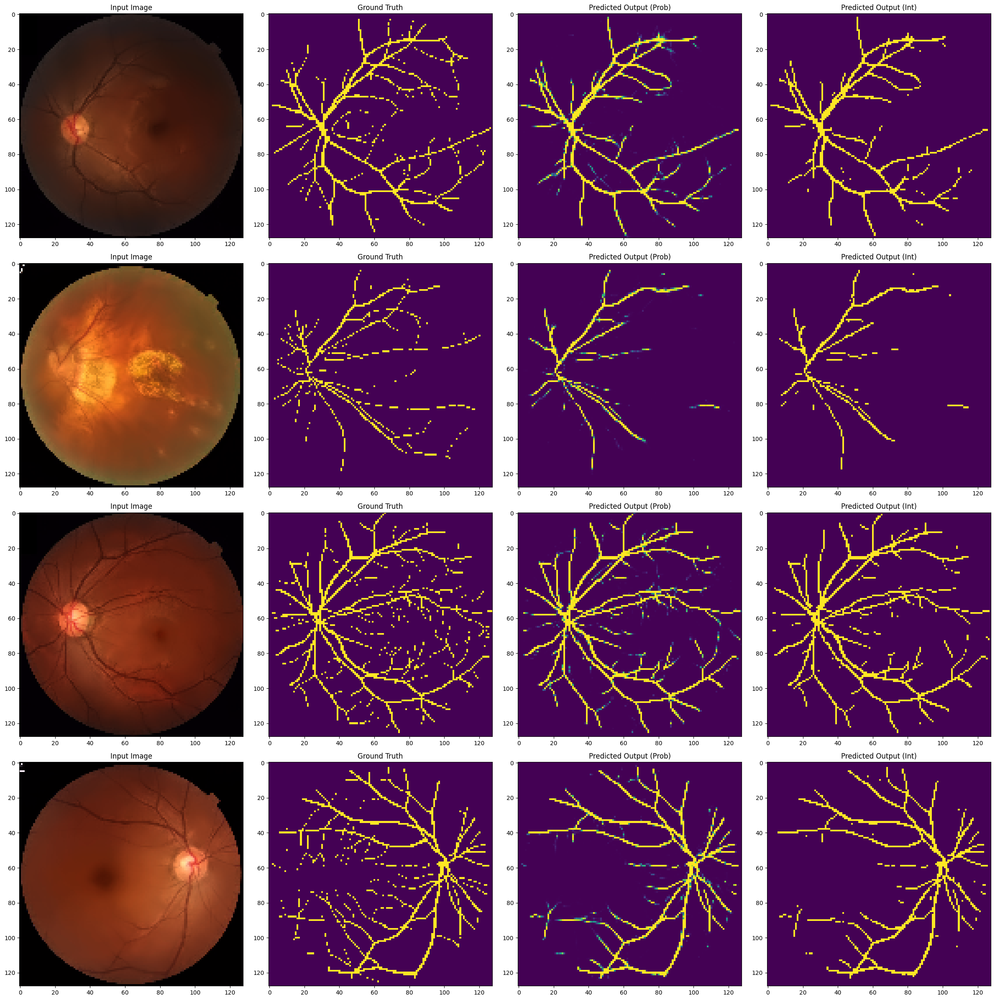

In [ ]:
train_id=10
# Get the predicted output for the train set
y_pred = model.predict(custom_gen_train[train_id][0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(custom_gen_train[train_id][0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(custom_gen_train[train_id][1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

1/1 [==============================] - 0s 60ms/step


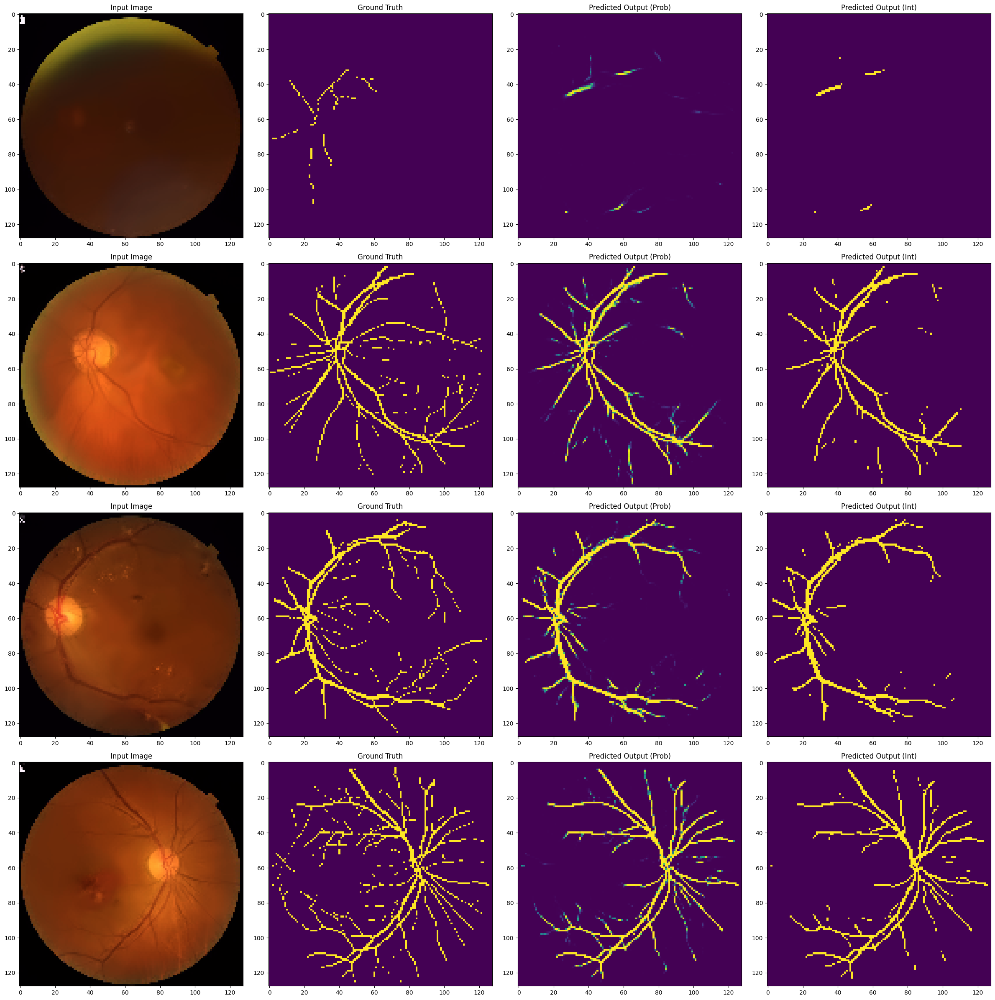

In [ ]:
test_id=14
# Get the predicted output for the test set
y_pred = model.predict(custom_gen_test[test_id][0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(custom_gen_test[test_id][0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(custom_gen_test[test_id][1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

In [ ]:
# Nothing
import segmentation_models as sm
import tensorflow as tf

BACKBONE = 'efficientnetb3'
preprocess_input = sm.get_preprocessing(BACKBONE)

# define model
#model = sm.Unet(BACKBONE, classes=1, encoder_weights='imagenet',  activation='sigmoid')
model = sm.Unet(BACKBONE, classes=1,  activation='sigmoid')

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
#dice_loss = sm.losses.DiceLoss()
#focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
#total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss

metrics = [sm.metrics.IOUScore(), sm.metrics.FScore()]

# compile keras model with defined optimozer, loss and metrics
model.compile('Adam', total_loss, metrics)


#model.compile('Adam', loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])


history = model.fit(custom_gen_train,
                    validation_data= custom_gen_test,
                    epochs=15,
                    validation_steps= len(custom_gen_test),
                    steps_per_epoch= len(custom_gen_train))

44107200/44107200 [==============================] - 0s 0us/step
Epoch 1/15
75/75 [==============================] - 1098s 14s/step - loss: 0.8078 - iou_score: 0.1591 - f1-score: 0.2685 - val_loss: 1.1905 - val_iou_score: 0.1035 - val_f1-score: 0.1873
Epoch 2/15
75/75 [==============================] - 161s 2s/step - loss: 0.3983 - iou_score: 0.4583 - f1-score: 0.6264 - val_loss: 0.7036 - val_iou_score: 0.2332 - val_f1-score: 0.3774
Epoch 3/15
75/75 [==============================] - 158s 2s/step - loss: 0.3044 - iou_score: 0.5661 - f1-score: 0.7226 - val_loss: 0.4973 - val_iou_score: 0.3797 - val_f1-score: 0.5496
Epoch 4/15
75/75 [==============================] - 152s 2s/step - loss: 0.2754 - iou_score: 0.6037 - f1-score: 0.7526 - val_loss: 0.3873 - val_iou_score: 0.4872 - val_f1-score: 0.6546
Epoch 5/15
75/75 [==============================] - 155s 2s/step - loss: 0.2575 - iou_score: 0.6271 - f1-score: 0.7706 - val_loss: 0.3576 - val_iou_score: 0.5148 - val_f1-score: 0.6790
Epoch 6/

1/1 [==============================] - 2s 2s/step


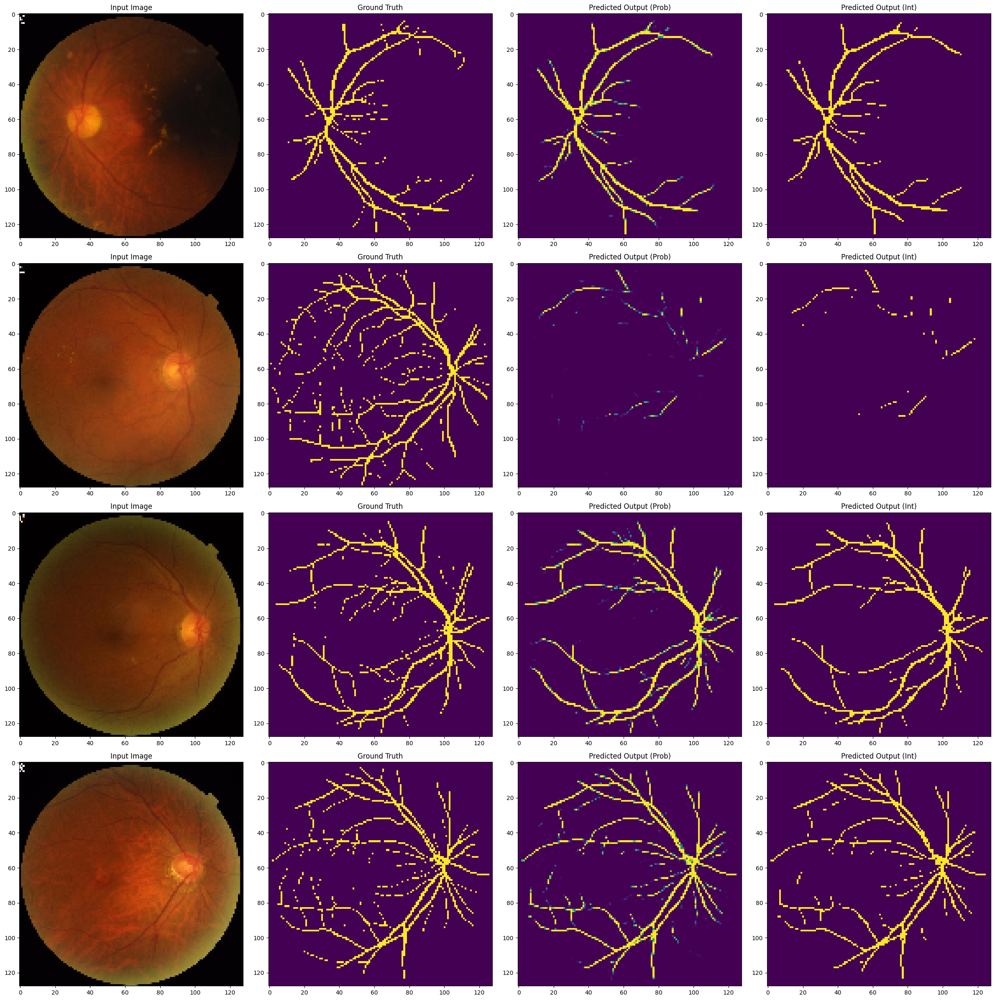

In [ ]:
train_id=10
# Get the predicted output for the train set
y_pred = model.predict(custom_gen_train[train_id][0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(custom_gen_train[train_id][0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(custom_gen_train[train_id][1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

1/1 [==============================] - 0s 31ms/step


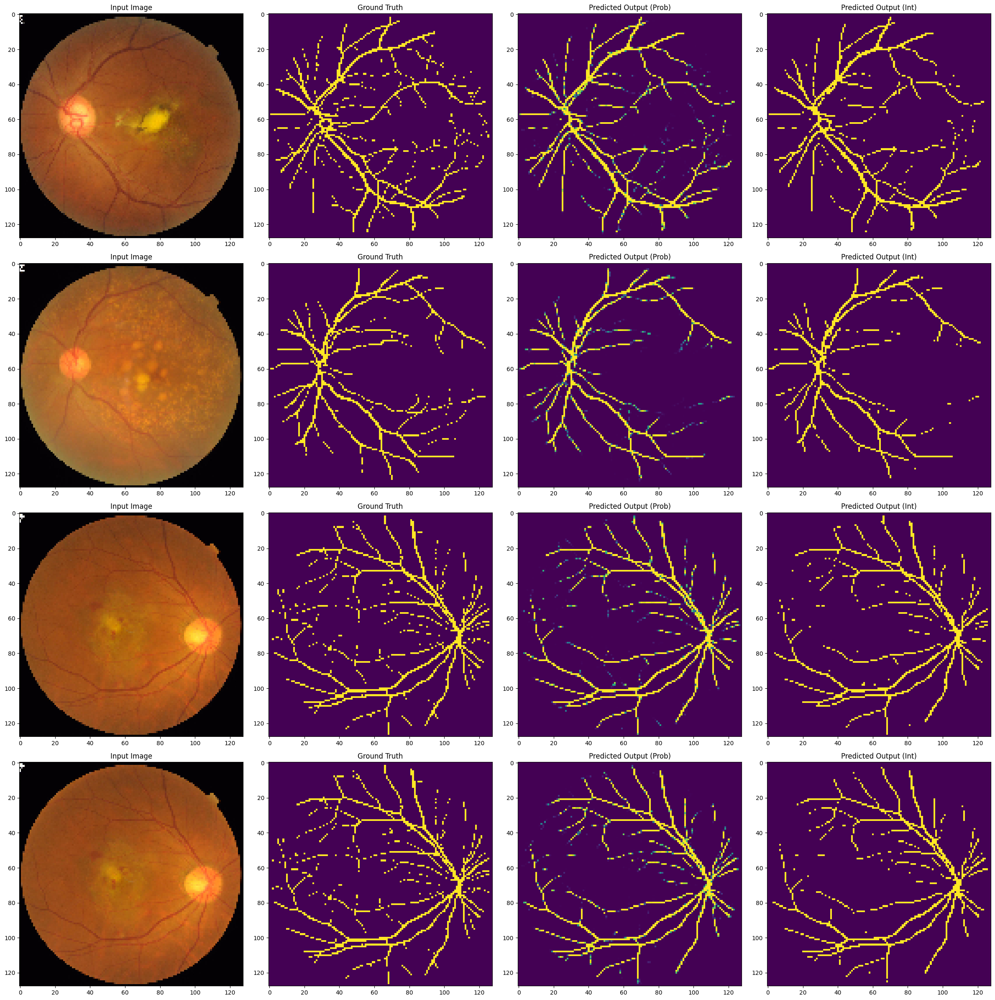

In [ ]:
test_id=14
# Get the predicted output for the test set
y_pred = model.predict(custom_gen_test[test_id][0])

# Plot the predicted output and the actual target
fig, ax = plt.subplots(4, 4, figsize=(24, 24))
for i in range(4):
    ax[i, 0].imshow(custom_gen_test[test_id][0][i])
    ax[i, 0].set_title('Input Image')
    ax[i, 1].imshow(custom_gen_test[test_id][1][i].squeeze())
    ax[i, 1].set_title('Ground Truth')
    ax[i, 2].imshow(y_pred[i].squeeze())
    ax[i, 2].set_title('Predicted Output (Prob)')
    ax[i, 3].imshow(y_pred[i].squeeze().round())
    ax[i, 3].set_title('Predicted Output (Int)')
plt.tight_layout()

## Draft

In [ ]:
batch_size= 8
custom_gen_train= CustomDataGenerator(train_df, batch_size= batch_size, resolution=128, img_dir= train_imgs_path, tg_dir= train_imgs_gt_path, preprocessing=None, denoising= False)
custom_gen_test= CustomDataGenerator(test_df, batch_size= batch_size, resolution=128, img_dir= test_imgs_path, tg_dir= test_imgs_gt_path, preprocessing=None, denoising= False)

Found 600 validated image filenames.
Found 600 validated image filenames.
Found 200 validated image filenames.
Found 200 validated image filenames.


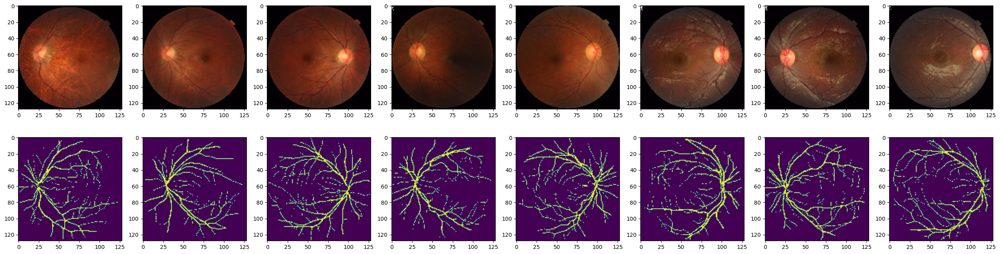

In [ ]:
sample_img, sample_tg= custom_gen_test.__getitem__(11)

fig, ax= plt.subplots(2, batch_size, figsize=(batch_size*4, 8))
for i in range(batch_size):
    ax[0,i].imshow(sample_img[i])
    ax[1,i].imshow(sample_tg[i])

ref_imgs= sample_img.copy()
ref_tgs= sample_tg.copy()

In [ ]:
class ImagePlotCallback(tf.keras.callbacks.Callback):
    def __init__(self, model, images, tgs, save_path):
        super(ImagePlotCallback, self).__init__()
        self.model = model
        self.images = images
        self.tgs= tgs
        self.save_path = save_path

    def on_epoch_end(self, epoch, logs=None):
        # Run the model on the images
        predictions = self.model.predict(self.images)

        fig, ax = plt.subplots(4, 8, figsize=(24, 12))
        for i in range(8):
            ax[0, i].imshow(self.images[i])
            #ax[i, 0].set_title('Input Image')
            ax[0, i].axis('off')
            ax[1, i].imshow(self.tgs[i].squeeze())
            #ax[i, 1].set_title('Ground Truth')
            ax[1, i].axis('off')
            ax[2, i].imshow(predictions[i].squeeze())
            #ax[i, 2].set_title('Predicted Output (Prob)')
            ax[2, i].axis('off')
            ax[3, i].imshow(predictions[i].squeeze().round())
            #ax[i, 3].set_title('Predicted Output (Int)')
            ax[3, i].axis('off')
        #ax.set_axis_off()
        plt.tight_layout()
        plt.savefig(f"{self.save_path}batch_epoch_{epoch}.png")
        plt.close(fig)

        fig, ax = plt.subplots(2, 4, figsize=(24, 12))
        for i in range(8):
            ax[i//4, i%4].imshow(predictions[i].squeeze())
            ax[i//4, i%4].axis('off')
        #ax.set_axis_off()
        # Save the plot
        plt.tight_layout()
        plt.savefig(f"{self.save_path}pred_epoch_{epoch}.png")
        plt.close(fig)

folder_path = "/content/ref_imgs_2/"

# Create the folder if it doesn't exist
if not os.path.exists(folder_path):
      os.makedirs(folder_path)

In [ ]:
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [ ]:
import segmentation_models as sm
import tensorflow as tf

BACKBONE = 'efficientnetb3'
preprocess_input = sm.get_preprocessing(BACKBONE)

model = sm.Unet(BACKBONE, classes=1,  activation='sigmoid')

total_loss = sm.losses.binary_focal_dice_loss

metrics = [sm.metrics.IOUScore(), sm.metrics.FScore()]

# Create an instance of the ImagePlotCallback
image_plot_callback = ImagePlotCallback(model, ref_imgs, ref_tgs, folder_path)

model.compile('Adam', total_loss, metrics)

history = model.fit(custom_gen_train,
                    validation_data= custom_gen_test,
                    epochs=15,
                    validation_steps= len(custom_gen_test),
                    #validation_steps= 3,
                    steps_per_epoch= len(custom_gen_train),
                    #steps_per_epoch= 5,
                    callbacks=[image_plot_callback])

Epoch 1/15
75/75 [==============================] - 356s 4s/step - loss: 0.5775 - iou_score: 0.3085 - f1-score: 0.4571 - val_loss: 1.0326 - val_iou_score: 0.1226 - val_f1-score: 0.2179
Epoch 2/15
75/75 [==============================] - 161s 2s/step - loss: 0.3310 - iou_score: 0.5358 - f1-score: 0.6969 - val_loss: 0.6343 - val_iou_score: 0.2745 - val_f1-score: 0.4299
Epoch 3/15
75/75 [==============================] - 159s 2s/step - loss: 0.2845 - iou_score: 0.5933 - f1-score: 0.7444 - val_loss: 0.4844 - val_iou_score: 0.4027 - val_f1-score: 0.5731
Epoch 4/15
75/75 [==============================] - 156s 2s/step - loss: 0.2635 - iou_score: 0.6206 - f1-score: 0.7655 - val_loss: 0.3857 - val_iou_score: 0.4881 - val_f1-score: 0.6553
Epoch 5/15
75/75 [==============================] - 161s 2s/step - loss: 0.2486 - iou_score: 0.6404 - f1-score: 0.7805 - val_loss: 0.3401 - val_iou_score: 0.5367 - val_f1-score: 0.6979
Epoch 6/15
75/75 [==============================] - 160s 2s/step - loss: 0.

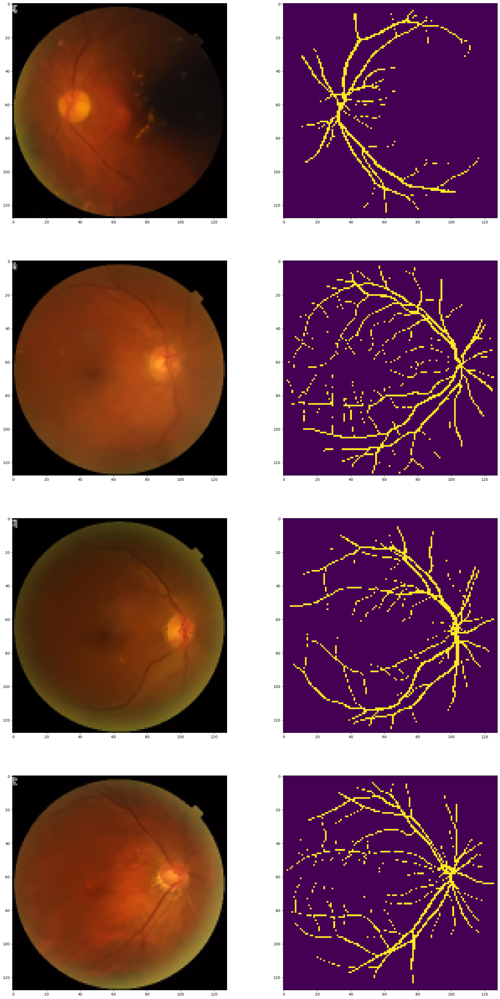

In [ ]:
# rescale denoise rescale
sample_img, sample_tg= custom_gen_train.__getitem__(10)

fig, ax= plt.subplots(4, 2, figsize=(24, 24*2))
for i in range(4):
    ax[i, 0].imshow(sample_img[i])
    ax[i, 1].imshow(sample_tg[i])

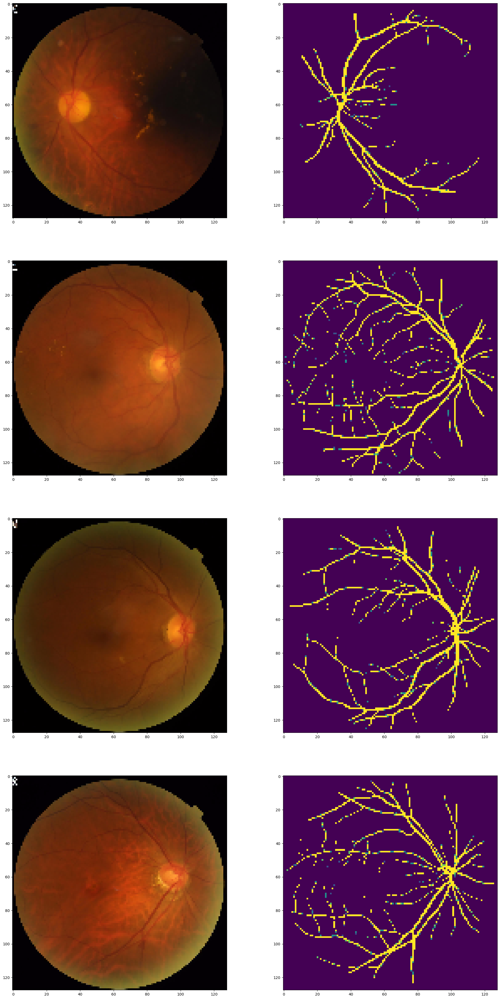

In [ ]:
# denoise rescale
sample_img, sample_tg= custom_gen_train.__getitem__(10)

fig, ax= plt.subplots(4, 2, figsize=(24, 24*2))
for i in range(4):
    ax[i, 0].imshow(sample_img[i])
    ax[i, 1].imshow(sample_tg[i])

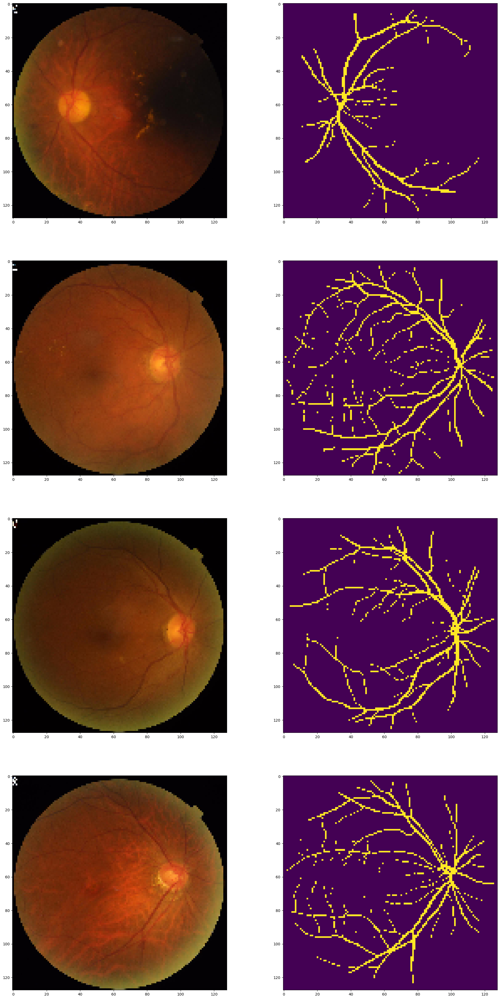

In [ ]:
# nothing
sample_img, sample_tg= custom_gen_train.__getitem__(10)

fig, ax= plt.subplots(4, 2, figsize=(24, 24*2))
for i in range(4):
    ax[i, 0].imshow(sample_img[i])
    ax[i, 1].imshow(sample_tg[i])

In [ ]:
import tensorflow as tf
class CustomDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, dataframe, batch_size=32, shuffle=True, augment=False):
        #self.img_dir = img_dir
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.dataframe = dataframe
        self.augment = augment

    def __len__(self):
        #return len(self.generator)
        return (len(self.dataframe)-1) // self.batch_size
    def on_epoch_end(self):
        #self.generator.on_epoch_end()
        self.dataframe = self.dataframe.sample(frac=1).reset_index(drop=True)

    def __getitem__(self, index):
        #return self.generator[idx]
        X= []
        y= []
        for ba in range(self.batch_size):
            img_name=  self.dataframe['img_fp'][self.batch_size * index + ba]
            img= plt.imread(img_name)
            img= cv2.resize(img, (256, 256))
            X.append(img)

            tg_name= self.dataframe['gt_fp'][self.batch_size * index + ba]
            tg= plt.imread(tg_name)
            tg= cv2.resize(tg, (256, 256))
            y.append(tg)

        X= np.array(X, dtype=np.float32)
        #X= np.divide(X, 255.)
        y= np.array(y, dtype=np.float32)

        return X, y